# Damage detection using semantic segmentation

**NOTE:** Use the `sm-legacy` environment.

## Check GPU Support

In [1]:
import tensorflow as tf
print("TF Version:", tf.__version__)
gpus = tf.config.list_physical_devices("GPU")
print("GPUs detected:", gpus)
print("Built with CUDA:", tf.test.is_built_with_cuda())
print("Built with GPU support:", tf.test.is_built_with_gpu_support())

TF Version: 2.2.0
GPUs detected: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Built with CUDA: True
Built with GPU support: True


## Imports and configurations

In [2]:
import os

os.environ["SM_FRAMEWORK"] = "tf.keras"

import random
import math
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob
from tqdm import tqdm
import multiprocessing as mp

# TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.utils import Sequence
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Image augmentation
import albumentations as A
from albumentations.core.transforms_interface import ImageOnlyTransform

# Segmentation Models
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [3]:
print(sm.framework())  # should output: "tf.keras"

tf.keras


## Define the directories

In [4]:
DATA_DIR = "../../data/damaged-and-mask-dataset/"

In [5]:
x_train_dir = os.path.join(DATA_DIR, "img-with-val/train")
y_train_dir = os.path.join(DATA_DIR, "mask-with-val/train")

x_valid_dir = os.path.join(DATA_DIR, "img-with-val/val")
y_valid_dir = os.path.join(DATA_DIR, "mask-with-val/val")

x_test_dir = os.path.join(DATA_DIR, "img-with-val/test")
y_test_dir = os.path.join(DATA_DIR, "mask-with-val/test")

## Dataloader and utility functions

In [6]:
# helper function for data visualization
def visualize(**images):
    """Plot images in one row with expanded, user-friendly titles."""
    # Mapping from keys to expanded titles
    title_map = {
        "image": "Input Image",
        "ground_truth_mask": "Ground Truth Mask",
        "gt_mask": "Ground Truth Mask",
        "predicted_mask": "Predicted Mask",
        "pr_mask": "Predicted Mask",
        "mask": "Mask"
    }

    n = len(images)
    plt.figure(figsize=(5 * n, 5))  # scalable size per image

    for i, (name, image) in enumerate(images.items()):
        title = title_map.get(name, " ".join(name.split("_")).title())
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(title)
        plt.imshow(image, cmap="gray" if image.ndim == 2 else None)

    plt.tight_layout()
    plt.show()


# helper function for data visualization    
def denormalize(x):
    """Safely scale image to 0–1 for visualization."""
    x = np.array(x)  # just in case it's a tensor
    x_max = np.nanpercentile(x, 98)
    x_min = np.nanpercentile(x, 2)
    denom = x_max - x_min

    # avoid division by zero
    if denom == 0 or np.isnan(denom):
        return np.zeros_like(x)

    x = (x - x_min) / denom
    x = np.clip(x, 0, 1)
    return x


def load_npz_with_aug(path_and_aug):
    path, augment_fn = path_and_aug
    with np.load(path) as data:
        image = data['image']
        mask = data['mask']

        # CLAHE (applied on L channel of LAB)
        image_uint8 = (image * 255).astype(np.uint8)
        lab = cv2.cvtColor(image_uint8, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        cl = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(l)
        lab_clahe = cv2.merge((cl, a, b))
        image = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2RGB).astype(np.float32) / 255.0

        # Albumentations augmentations
        if augment_fn:
            augmented = augment_fn(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        return image, mask


def batch_generator(file_paths, batch_size, augment_fn=None, shuffle=True):
    pool = mp.Pool(mp.cpu_count())

    while True:
        if shuffle:
            random.shuffle(file_paths)

        for i in range(0, len(file_paths), batch_size):
            batch_paths = file_paths[i:i + batch_size]
            args = [(p, augment_fn) for p in batch_paths]

            results = pool.map(load_npz_with_aug, args)
            images, masks = zip(*results)

            yield np.stack(images), np.stack(masks)


In [7]:
# classes for data loading and preprocessing
class Dataset:
    """Damage Detection Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transformation pipeline 
        preprocessing (albumentations.Compose): data preprocessing pipeline
    """

    def __init__(
        self, 
        images_dir, 
        masks_dir, 
        classes=None, 
        augmentation=None, 
        preprocessing=None,
        subset_size=None  # NEW
    ):
        self.all_ids = os.listdir(masks_dir)
        self.base_ids = [mask_id.replace('-mask.png', '') for mask_id in self.all_ids]
        
        # Apply subset sampling
        if subset_size:
            n = int(len(self.base_ids) * subset_size) if isinstance(subset_size, float) else subset_size
            self.base_ids = self.base_ids[:n]
            self.all_ids = self.all_ids[:n]

        self.ids = self.all_ids
        
        self.masks_fps = [os.path.join(masks_dir, mask_id) for mask_id in self.all_ids]
        self.images_fps = [os.path.join(images_dir, base_id + '.png') for base_id in self.base_ids]
    
        for path in self.images_fps:
            if not os.path.exists(path):
                raise FileNotFoundError(f"Image not found: {path}")
        
        self.class_values = [1]
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        image = cv2.imread(self.images_fps[i])
        if image is None:
            raise FileNotFoundError(f"Failed to read image at: {self.images_fps[i]}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
        mask_path = self.masks_fps[i]
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            raise FileNotFoundError(f"Failed to read mask at: {mask_path}")
    
        mask = np.where(mask > 0, 1, 0).astype('float32')
        mask = np.expand_dims(mask, axis=-1)
    
        # Apply augmentation
        if self.augmentation is not None:
            augmented = self.augmentation(image=image, mask=mask)
            image, mask = augmented["image"], augmented["mask"]
    
        # Apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample["image"], sample["mask"]
    
        image = image.astype("float32")
        return image, mask
        
    def __len__(self):
        return len(self.ids)

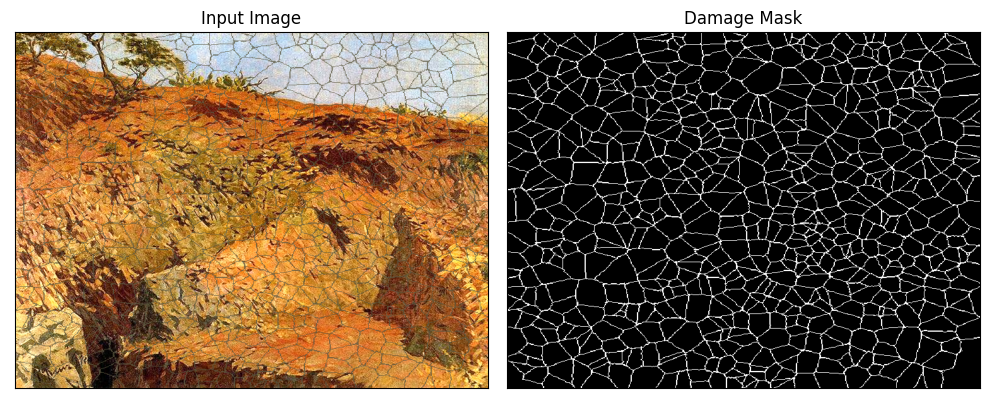

In [8]:
# Quick check on the dataset
dataset = Dataset(x_train_dir, y_train_dir, classes=["damage"])

image, mask = dataset[5]  # get some sample
visualize(
    image=denormalize(image),
    damage_mask=mask[..., 0].squeeze()
)


## Augmentations

In [9]:
# Clip and round mask values to [0, 1]
def round_clip_0_1(x, **kwargs):
    return x.round().clip(0, 1)

# Convert float32 image (0..1) to uint8 (0..255)
def to_uint8(x, **kwargs):
    return (x * 255).astype(np.uint8)

# Convert uint8 image (0..255) back to float32 (0..1)
def to_float32(x, **kwargs):
    return x.astype(np.float32) / 255.0

# CLAHE that works with float32 inputs by wrapping uint8 conversion
def safe_clahe():
    return A.Compose([
        A.Lambda(image=to_uint8),
        A.CLAHE(p=1),
        A.Lambda(image=to_float32),
    ])

# Heavy augmentation pipeline
def get_training_augmentation():
    train_transform = [

        A.HorizontalFlip(p=0.5),

        A.ShiftScaleRotate(
            shift_limit=0.05,     # safer shift
            scale_limit=0.2,      # moderate zoom
            rotate_limit=10,      # slight rotation
            p=1,
            border_mode=cv2.BORDER_REFLECT_101  # avoids black padding
        ),

        A.PadIfNeeded(min_height=320, min_width=320, always_apply=True, border_mode=cv2.BORDER_REFLECT_101),
        A.RandomCrop(height=320, width=320, always_apply=True),

        A.GaussNoise(var_limit=(10.0, 50.0), p=0.2),
        A.Perspective(scale=(0.05, 0.1), keep_size=True, p=0.5),

        A.OneOf([
            safe_clahe(),
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0, p=1),
            A.RandomGamma(p=1),
        ], p=0.9),

        A.OneOf([
            A.Sharpen(alpha=(0.2, 0.5), lightness=(0.5, 1.0), p=1),
            A.Blur(blur_limit=3, p=1),
            A.MotionBlur(blur_limit=3, p=1),
        ], p=0.9),

        A.OneOf([
            A.RandomBrightnessContrast(brightness_limit=0.2, p=1),
            A.HueSaturationValue(p=1),
        ], p=0.9),

        A.Lambda(mask=round_clip_0_1)
    ]
    
    return A.Compose(train_transform)


# Simple resize for validation
def get_validation_augmentation():
    return A.Compose([
        A.Resize(320, 320)
    ])


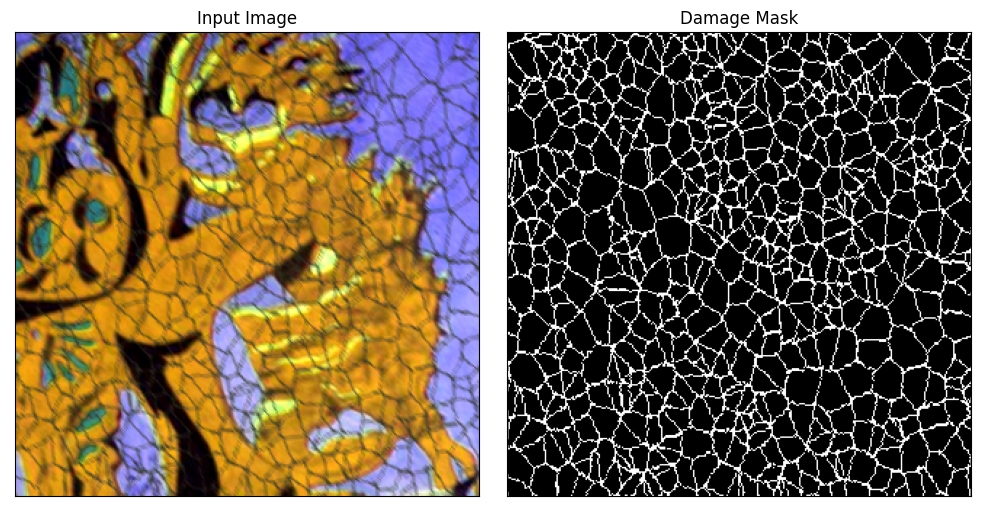

In [10]:
# Quick check on the augmented data
dataset = Dataset(x_train_dir, y_train_dir, classes=["damage"], augmentation=get_training_augmentation())

image, mask = dataset[12]  # get some sample
visualize(
    image=denormalize(image),
    damage_mask=mask[..., 0].squeeze(),
)


## Segmentation and model training

In [11]:
# Model and training configuration
BACKBONE = "resnet34"
INPUT_SHAPE = (320, 320, 3)
ENCODER_WEIGHTS = "imagenet"
BATCH_SIZE = 16
CLASSES = ["damage"]
LR = 0.0001
EPOCHS = 1

# Define network parameters
n_classes = 1 if len(CLASSES) == 1 else (len(CLASSES) + 1)  # add background if multiclass
activation = "sigmoid" if n_classes == 1 else "softmax"     # use sigmoid for binary, softmax for multiclass

In [12]:
# Create U-Net model with chosen backbone and parameters
model = sm.Unet(
    backbone_name=BACKBONE,
    encoder_weights=ENCODER_WEIGHTS,
    encoder_freeze=True,
    input_shape=INPUT_SHAPE,
    classes=n_classes,
    activation=activation
)

In [13]:
# Define optimizer
optimizer = tf.keras.optimizers.Adam(LR)

# Define loss components
dice_loss = sm.losses.DiceLoss()
if n_classes == 1:
    focal_loss = sm.losses.BinaryFocalLoss()
    total_loss = dice_loss + focal_loss  # or sm.losses.binary_focal_dice_loss
else:
    focal_loss = sm.losses.CategoricalFocalLoss()
    total_loss = dice_loss + focal_loss  # or sm.losses.categorical_focal_dice_loss

# Define metrics
metrics = [
    sm.metrics.IOUScore(threshold=0.5),
    sm.metrics.FScore(threshold=0.5)
]

# Compile model
model.compile(
    optimizer=optimizer,
    loss=total_loss,
    metrics=metrics
)

In [14]:
# Define callbacks: model checkpointing and learning rate reduction
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="../../models/best_model.h5",
        save_weights_only=True,
        save_best_only=True,
        mode="min"
    ),
    keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=3,
        verbose=1
    ),
    keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True,
        verbose=1
    )
]


In [15]:
train_file_paths = sorted(glob.glob("../../data/preprocessed-npz/train/*.npz"))
val_file_paths   = sorted(glob.glob("../../data/preprocessed-npz/valid/*.npz"))

train_gen = batch_generator(train_file_paths, batch_size=BATCH_SIZE, augment_fn=get_training_augmentation())
val_gen = batch_generator(val_file_paths, batch_size=BATCH_SIZE, augment_fn=get_validation_augmentation(), shuffle=False)

In [16]:
steps_per_epoch = math.ceil(len(train_file_paths) / BATCH_SIZE)
validation_steps = math.ceil(len(val_file_paths) / BATCH_SIZE)

In [17]:
history = model.fit(
    x=train_gen,
    steps_per_epoch=steps_per_epoch,
    validation_data=val_gen,
    validation_steps=validation_steps,
    epochs=EPOCHS,
    callbacks=callbacks,
    verbose=1
)


2162/2162 [==============================] - 967s 447ms/step - loss: 0.8170 - iou_score: 0.1269 - f1-score: 0.2204 - val_loss: 0.6536 - val_iou_score: 0.3545 - val_f1-score: 0.5223 - lr: 1.0000e-04


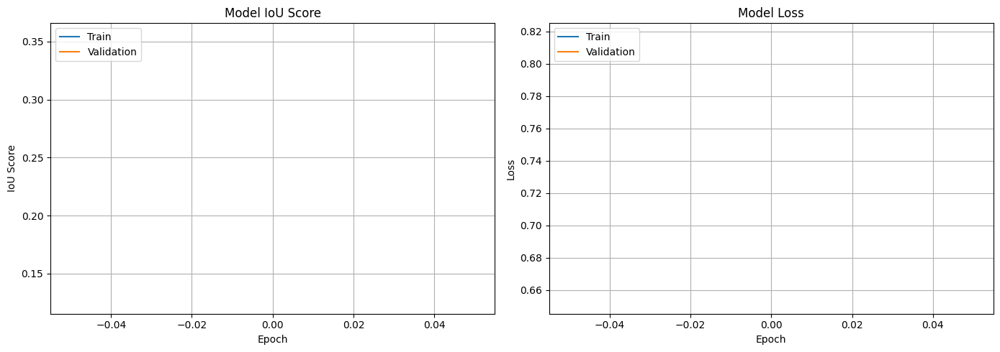

In [18]:
# Plot training history
plt.figure(figsize=(14, 5))

# Plot IOU Score
plt.subplot(1, 2, 1)
plt.plot(history.history["iou_score"], label="Train")
plt.plot(history.history["val_iou_score"], label="Validation")
plt.title("Model IoU Score")
plt.xlabel("Epoch")
plt.ylabel("IoU Score")
plt.legend(loc="upper left")
plt.grid(True)

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(history.history["loss"], label="Train")
plt.plot(history.history["val_loss"], label="Validation")
plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend(loc="upper left")
plt.grid(True)

plt.tight_layout()
plt.show()


## Model evaluation

**NOTE:** Please change the filepath for the model file below.

In [19]:
# Load best model weights from checkpoint
model.load_weights("../../models/best_model.h5")

In [20]:
test_file_paths = sorted(glob.glob("../../data/preprocessed-npz/test/*.npz"))
test_gen = batch_generator(test_file_paths, batch_size=BATCH_SIZE, shuffle=False)

In [25]:
test_steps = len(test_file_paths)
print(f"Test size: {test_steps}")

scores = model.evaluate(test_gen, steps=test_steps, verbose=1)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(model.metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.name, value))

Test size: 5188
5188/5188 [==============================] - 1238s 239ms/step - loss: 0.6544 - iou_score: 0.3555 - f1-score: 0.5235
Loss: 0.65436
mean loss: 0.35546
mean iou_score: 0.52348


## Visualization of results on the test dataset

In [31]:
def visualize_random_predictions(model, file_paths, augment_fn=None, n=5):
    """Visualize n random predictions using raw file paths instead of a generator."""
    sampled_paths = random.sample(file_paths, n)

    for path in sampled_paths:
        # Load and preprocess image + mask
        with np.load(path) as data:
            image = data['image']
            mask = data['mask']

        # Apply augmentation if specified
        if augment_fn:
            augmented = augment_fn(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        # CLAHE or other preprocessing (if applicable)
        image_uint8 = (image * 255).astype(np.uint8)
        lab = cv2.cvtColor(image_uint8, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        cl = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(l)
        lab_clahe = cv2.merge((cl, a, b))
        image = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2RGB).astype(np.float32) / 255.0

        # Predict mask
        prob_mask = model.predict(np.expand_dims(image, axis=0))[0]
        binary_mask = (prob_mask > 0.5).astype(np.float32)

        # Visualize
        visualize(
            image=denormalize(image),
            ground_truth_mask=mask[..., 0].squeeze(),
            predicted_mask=binary_mask[..., 0].squeeze()
        )


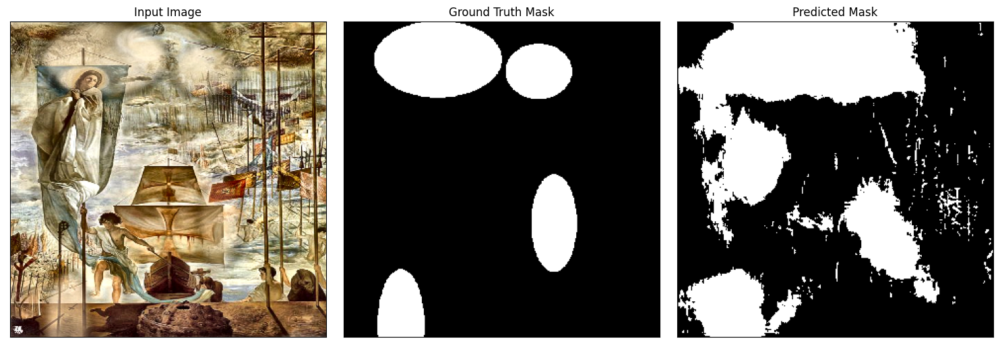

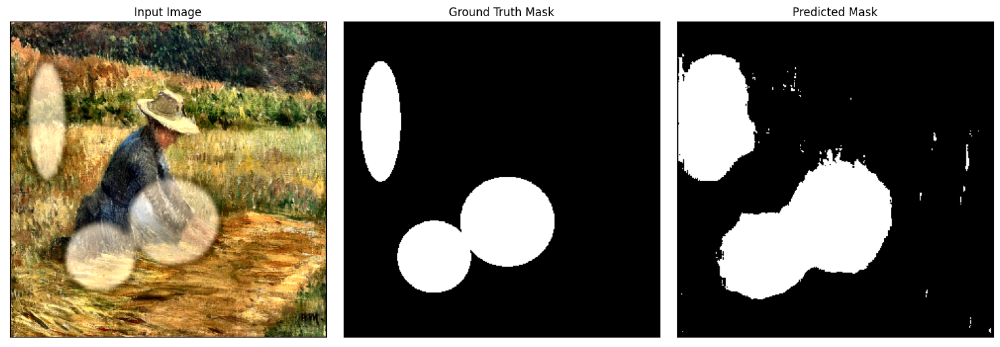

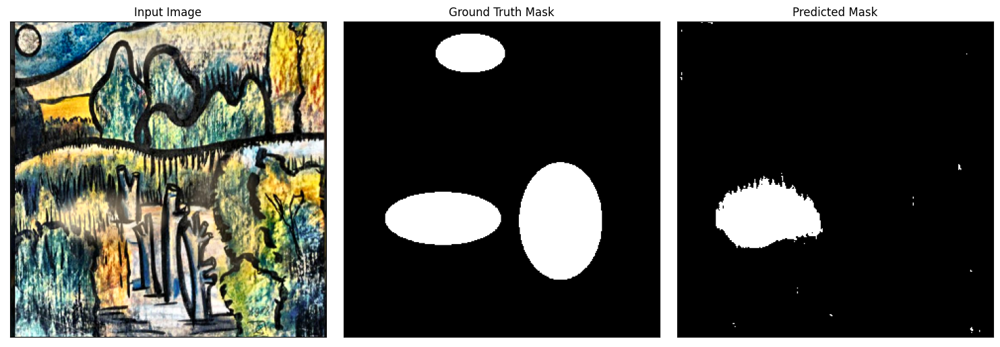

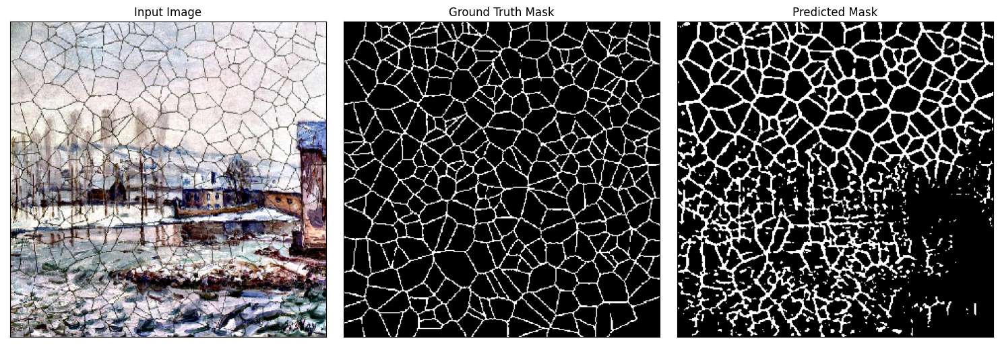

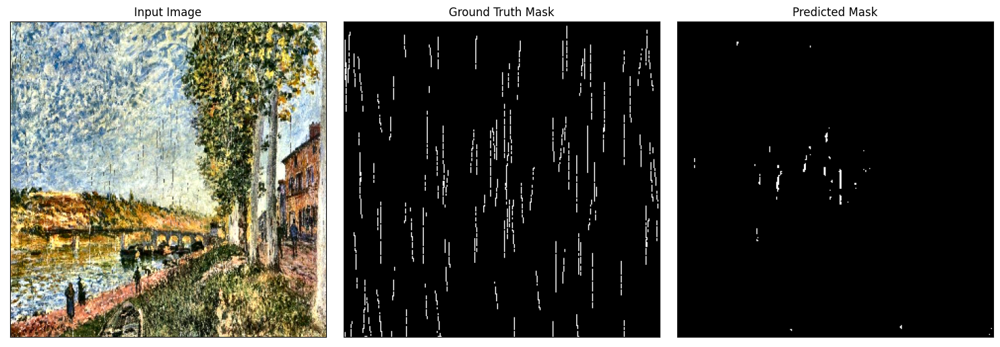

In [34]:
visualize_random_predictions(
    model=model,
    file_paths=test_file_paths,
    augment_fn=get_validation_augmentation(),
    n=5
)


## Testing out on real images

In [35]:
def predict_mask(model, image_path):
    # Load and preprocess image
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (320, 320))
    img = img.astype(np.float32) / 255.0

    # Add batch dimension
    input_tensor = np.expand_dims(img, axis=0)  # shape (1, 320, 320, 3)

    # Predict
    pred_mask = model.predict(input_tensor)[0]  # shape (320, 320, 1)

    # Threshold to binary
    binary_mask = (pred_mask > 0.5).astype(np.uint8)

    return denormalize(img), pred_mask[..., 0], binary_mask[..., 0]

In [36]:
def visualize_prediction(model, image_path):
    original_img, prob_mask, binary_mask = predict_mask(model, image_path)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(original_img)
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Predicted Mask (probability)")
    plt.imshow(prob_mask, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Binary Mask")
    plt.imshow(binary_mask, cmap="gray")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

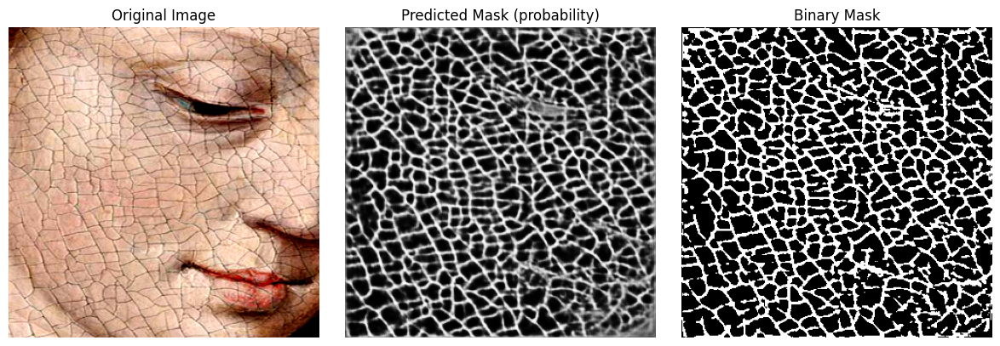

In [37]:
visualize_prediction(model, "../../data/cracked-portrait.jpg")

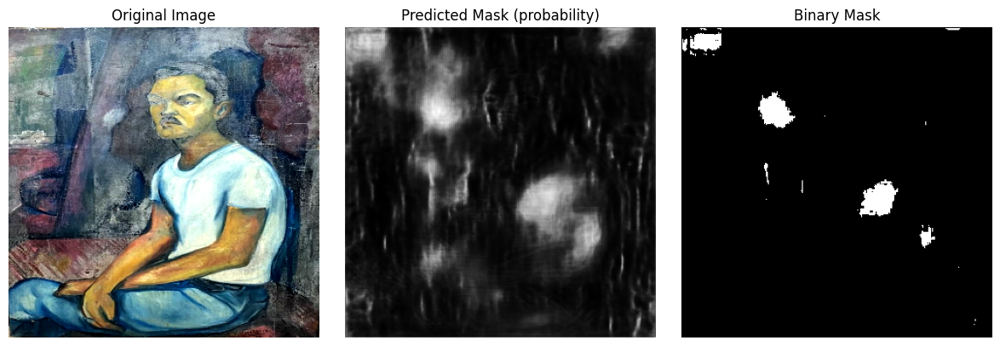

In [38]:
visualize_prediction(model, "../../data/leon-gallery-sample.jpg")

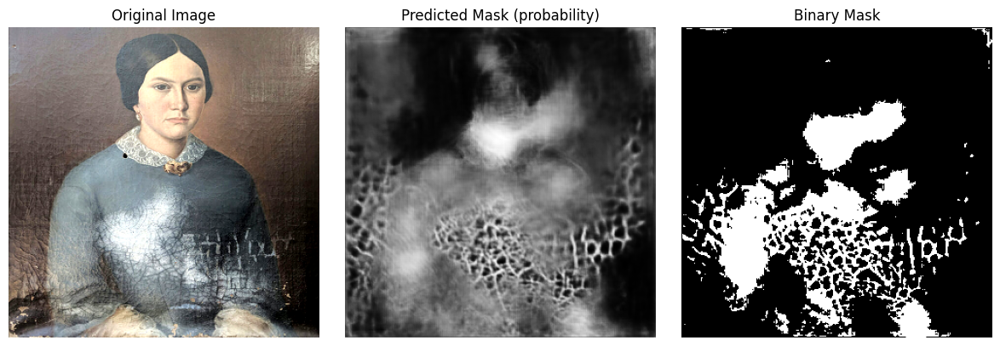

In [39]:
visualize_prediction(model, "../../data/fine-art-restoration-waterdamaged-bluelady-before.jpg")

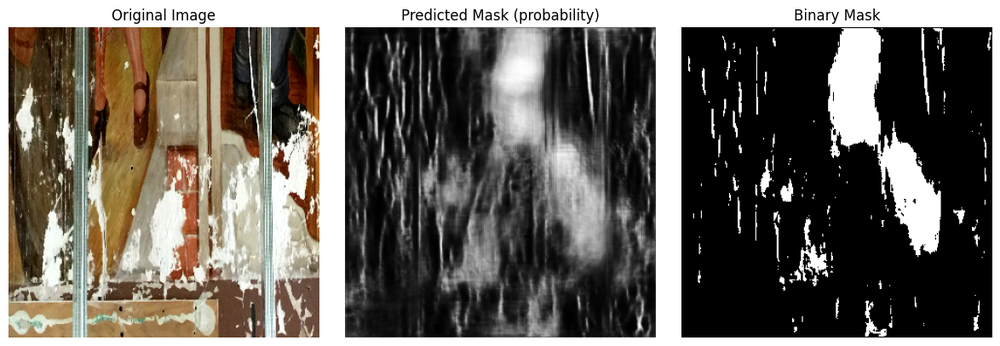

In [40]:
visualize_prediction(model, "../../data/different-types-of-art-damage-NB-min.jpg")

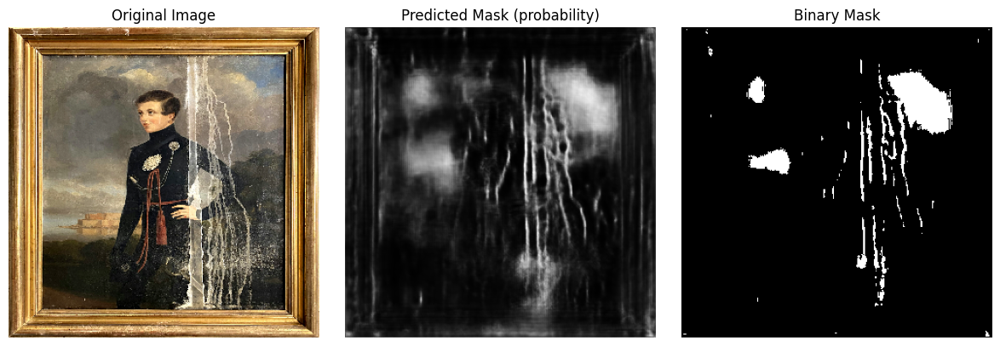

In [41]:
visualize_prediction(model, "../../data/fine-art-restoration-leak-damaged-boy-before.jpg")

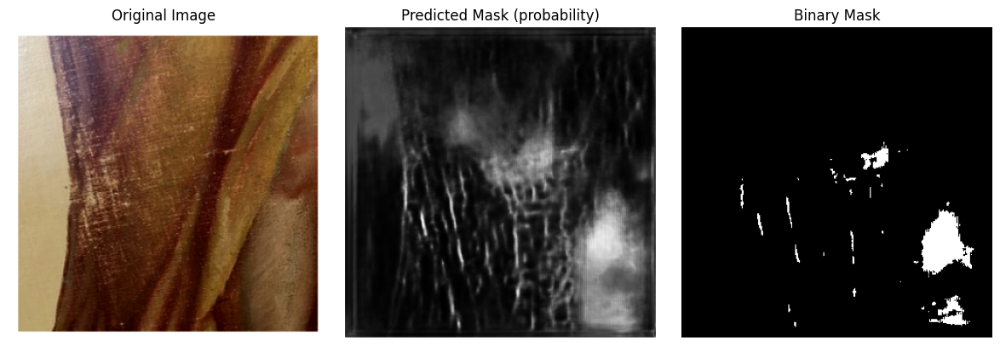

In [42]:
visualize_prediction(model, "../../data/scratch.png")